# Ground Truth Generation

In [7]:
# This is a project to extract some key information of the images

## 1. Ground Truth Generation

### 1.1 Extract dpx file

In [40]:
from __future__ import print_function
import numpy as np
from hmmlearn import hmm
import cv2
import os
import sys
import matplotlib.pyplot as plt
from skimage import img_as_ubyte
import random
import math
import torch
import pandas as pd
%matplotlib inline
from HiddenMarkovModel import HiddenMarkovModel
# https://gist.github.com/jackdoerner/1c9c48956a1e00a29dbc
import struct

In [9]:
orientations = {
	0: "Left to Right, Top to Bottom",
	1: "Right to Left, Top to Bottom",
	2: "Left to Right, Bottom to Top",
	3: "Right to Left, Bottom to Top",
	4: "Top to Bottom, Left to Right",
	5: "Top to Bottom, Right to Left",
	6: "Bottom to Top, Left to Right",
	7: "Bottom to Top, Right to Left"
}

descriptors = {
	1: "Red",
	2: "Green",
	3: "Blue",
	4: "Alpha",
	6: "Luma (Y)",
	7: "Color Difference",
	8: "Depth (Z)",
	9: "Composite Video",
	50: "RGB",
	51: "RGBA",
	52: "ABGR",
	100: "Cb, Y, Cr, Y (4:2:2)",
	102: "Cb, Y, Cr (4:4:4)",
	103: "Cb, Y, Cr, A (4:4:4:4)"
}

packings = {
	0: "Packed into 32-bit words",
	1: "Filled to 32-bit words, Padding First",
	2: "Filled to 32-bit words, Padding Last"
}

encodings = {
	0: "No encoding",
	1: "Run Length Encoding"
}

transfers = {
	1: "Printing Density",
	2: "Linear",
	3: "Logarithmic",
	4: "Unspecified Video",
	5: "SMPTE 274M",
	6: "ITU-R 709-4",
	7: "ITU-R 601-5 system B or G",
	8: "ITU-R 601-5 system M",
	9: "Composite Video (NTSC)",
	10: "Composite Video (PAL)",
	11: "Z (Linear Depth)",
	12: "Z (Homogenous Depth)"
}

colorimetries = {
	1: "Printing Density",
	4: "Unspecified Video",
	5: "SMPTE 274M",
	6: "ITU-R 709-4",
	7: "ITU-R 601-5 system B or G",
	8: "ITU-R 601-5 system M",
	9: "Composite Video (NTSC)",
	10: "Composite Video (PAL)"
}

propertymap = [
	#(field name, offset, length, type)

	('magic', 0, 4, 'magic'),
	('offset', 4, 4, 'I'),
	('dpx_version', 8, 8, 'utf8'),
	('file_size', 16, 4, 'I'),
	('ditto', 20, 4, 'I'),
	('filename', 36, 100, 'utf8'),
	('timestamp', 136, 24, 'utf8'),
	('creator', 160, 100, 'utf8'),
	('project_name', 260, 200, 'utf8'),
	('copyright', 460, 200, 'utf8'),
	('encryption_key', 660, 4, 'I'),

	('orientation', 768, 2, 'H'),
	('image_element_count', 770, 2, 'H'),
	('width', 772, 4, 'I'),
	('height', 776, 4, 'I'),

	('data_sign', 780, 4, 'I'),
	('descriptor', 800, 1, 'B'),
	('transfer_characteristic', 801, 1, 'B'),
	('colorimetry', 802, 1, 'B'),
	('depth', 803, 1, 'B'),
	('packing', 804, 2, 'H'),
	('encoding', 806, 2, 'H'),
	('line_padding', 812, 4, 'I'),
	('image_padding', 816, 4, 'I'),
	('image_element_description', 820, 32, 'utf8'),

	('input_device_name', 1556, 32, 'utf8'),
	('input_device_sn', 1588, 32, 'utf8')
]

def readDPXMetaData(f):
	f.seek(0)
	bytes = f.read(4)
	magic = bytes.decode(encoding='UTF-8')
	if magic != "SDPX" and magic != "XPDS":
		return None
	endianness = ">" if magic == "SDPX" else "<"

	meta = {}

	for p in propertymap:
		f.seek(p[1])
		bytes = f.read(p[2])
		if p[3] == 'magic':
			meta[p[0]] = bytes.decode(encoding='UTF-8')
			meta['endianness'] = "be" if magic == "SDPX" else "le"
		elif p[3] == 'utf8':
			meta[p[0]] = bytes.decode(encoding='UTF-8')
		elif p[3] == 'B':
			meta[p[0]] = struct.unpack(endianness + 'B', bytes)[0]
		elif p[3] == 'H':
			meta[p[0]] = struct.unpack(endianness + 'H', bytes)[0]
		elif p[3] == 'I':
			meta[p[0]] = struct.unpack(endianness + 'I', bytes)[0]

	return meta

def readDPXImageData(f, meta):
    if meta['depth'] != 10 or meta['packing'] != 1 or meta['encoding'] != 0 or meta['descriptor'] != 50:
        return None

    width = meta['width']
    height = meta['height']
    image = np.empty((height, width, 3), dtype=float)# Not float, but int

    f.seek(meta['offset'])
    raw = np.fromfile(f, dtype=np.dtype(np.int32), count=width*height, sep="")
    raw = raw.reshape((height,width))

    if meta['endianness'] == 'be':
        raw = raw.byteswap()

    image[:,:,0] = (((raw >> 22) & 0x000003FF)/ 0x000003FF)
    image[:,:,1] = (((raw >> 12) & 0x000003FF)/ 0x000003FF)
    image[:,:,2] = (((raw >> 2) & 0x000003FF)/ 0x000003FF)

    return image

### 1.2 Extract degraded image

D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Original\Original.00952218.dpx


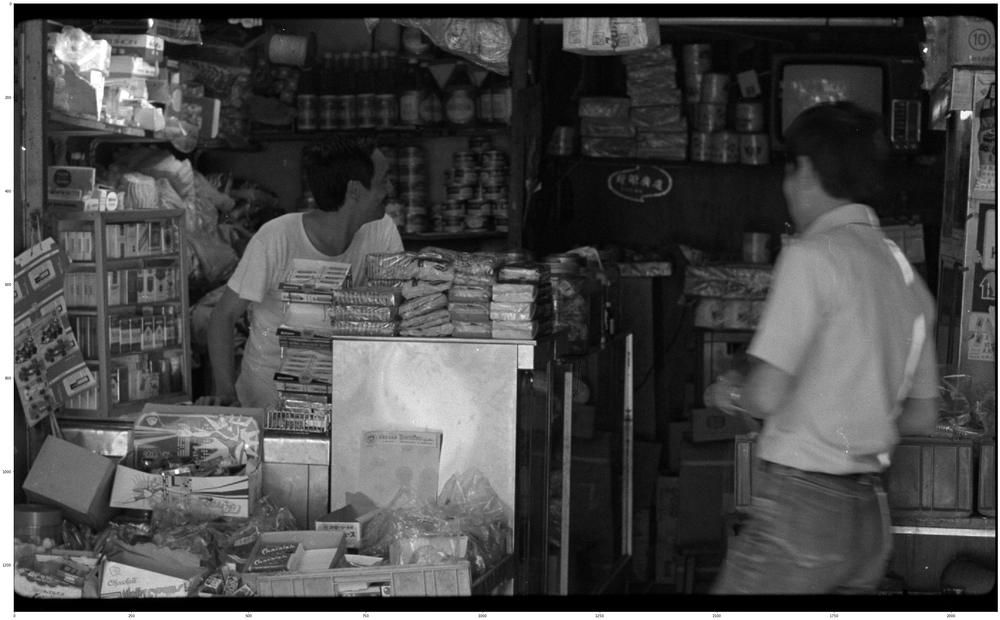

In [10]:
#Extract image
np.set_printoptions(threshold=10000)
def my_show_gray(img):
    plt.imshow(img,cmap='gray')
plt.figure(figsize=(50,50))
path_to_save = 'D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Original'
data = np.zeros((13,1300,2100))
current_frame = 952218
name = 'Original.00' + str(current_frame) + '.dpx'
print(os.path.join(path_to_save, name))
f = open(os.path.join(path_to_save, name), "rb")
meta = readDPXMetaData(f)
img = readDPXImageData(f, meta)
# https://www.cnblogs.com/denny402/p/5122328.html
from skimage import img_as_ubyte
dst=img_as_ubyte(img)
img_ori = cv2.cvtColor(dst,cv2.COLOR_RGB2GRAY)
my_show_gray(img_ori)

### 1.3 Extract restored image

D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Final\Final.00952218.dpx


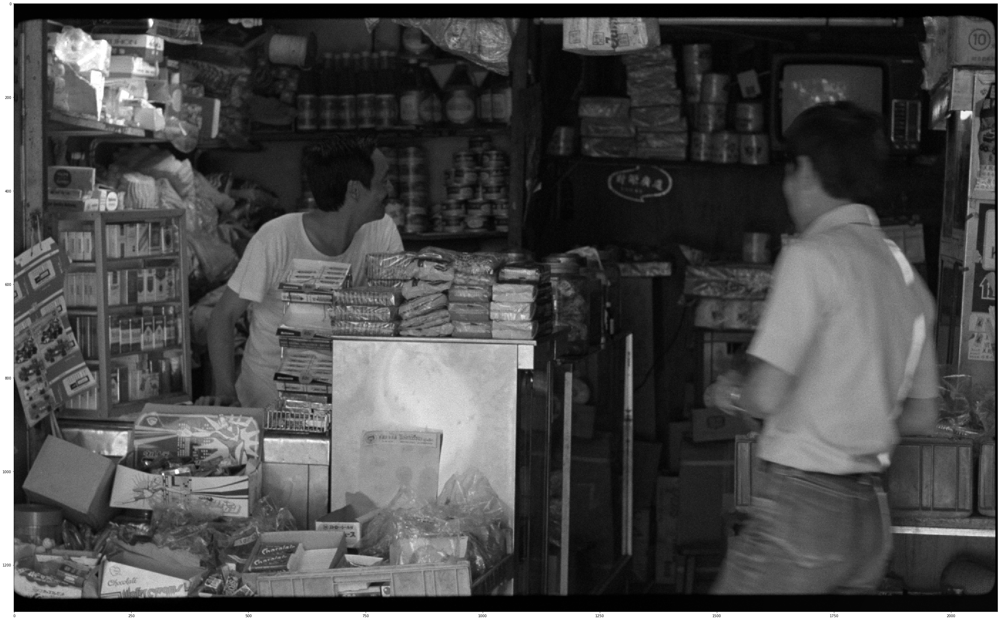

In [11]:
#Extract image
np.set_printoptions(threshold=10000)
def my_show_gray(img):
    plt.imshow(img,cmap='gray')
plt.figure(figsize=(50,50))
path_to_save = 'D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Final'
data = np.zeros((13,1300,2100))
current_frame = 952218
name = 'Final.00' + str(current_frame) + '.dpx'
print(os.path.join(path_to_save, name))
f = open(os.path.join(path_to_save, name), "rb")
meta = readDPXMetaData(f)
img = readDPXImageData(f, meta)
# https://www.cnblogs.com/denny402/p/5122328.html
from skimage import img_as_ubyte
dst=img_as_ubyte(img)
img_fin = cv2.cvtColor(dst,cv2.COLOR_RGB2GRAY)
my_show_gray(img_fin)

### 1.4 Compare two images

number of defect= 319


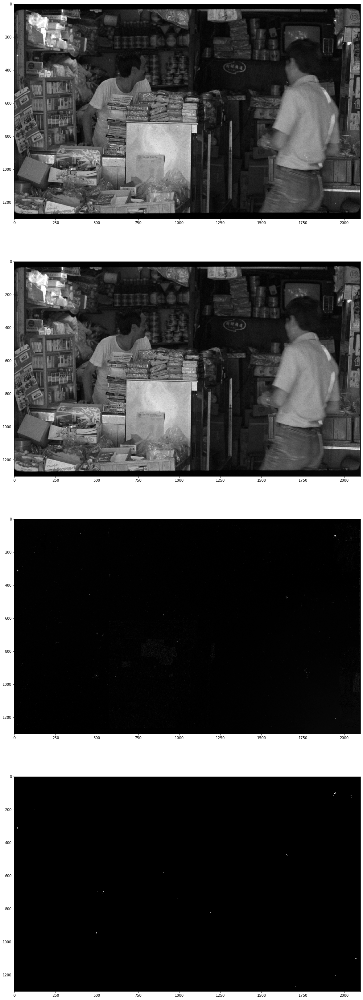

In [12]:
img_cmp_dif = np.zeros((1300,2100),dtype=np.int)
img_cmp_bin = np.zeros((1300,2100),dtype=np.int)
img_cmp_255 = np.zeros((1300,2100),dtype=np.int)

defect_cnt=0

def one_to_255(value):
    if (value==1):
        return 255
    else:
        return 0

for i in range(0,1300): #0-1300
    for j in range(0,2100): #0-2100
        img_cmp_dif[i][j]= abs(int(img_fin[i][j])-int(img_ori[i][j]))# Must Convert to int to avoid the ubyte overflow!!!
        if(img_cmp_dif[i][j]>50):#we cannot use "==", 30_319, 40->434,///30->647,//20->1953,25->982,10->13905,
            #20 is integrate but too much noise
            #50 is pure but lose too much information
            img_cmp_bin[i][j]=1
            defect_cnt = defect_cnt + 1
            #print('i=',i,'j=',j,'fin=',img_fin[i][j],'ori=',img_ori[i][j],'dif=',img_cmp_dif[i][j],'bin=',img_cmp_bin[i][j])
        else:
            img_cmp_bin[i][j]=0
        img_cmp_255[i][j] = one_to_255(img_cmp_bin[i][j])

print('number of defect=',defect_cnt)        
plt.figure(figsize=(50,50))
plt.subplot(4,1,1)        
my_show_gray(img_ori)
plt.subplot(4,1,2)        
my_show_gray(img_fin)
plt.subplot(4,1,3)        
my_show_gray(img_cmp_dif)
plt.subplot(4,1,4)        
my_show_gray(img_cmp_255)

In [13]:
# There is two problem about thresholding
# 1. Some area are brighten
# 2. Some artifact's luminance is closed to the restored one
# Threshold too small, too many noise
# Threshold too large, observable artifact missed
# Final should be darker, but here the final is brighter
# We pusuit the pure here, choose high threshold

### 1.5 Integrate the above operation into one function

In [21]:
def my_show_gray(img):
        plt.imshow(img,cmap='gray')
        
def one_to_255(value):
    if (value==1):
        return 255
    else:
        return 0

def extract_true_defect(current_frame):#Typical 952218
    #Extract image
    plt.figure(figsize=(50,50))
    path_to_save = 'D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Original'
    data = np.zeros((13,1300,2100))
    name = 'Original.00' + str(current_frame) + '.dpx'
    f = open(os.path.join(path_to_save, name), "rb")
    meta = readDPXMetaData(f)
    img = readDPXImageData(f, meta)
    # https://www.cnblogs.com/denny402/p/5122328.html
    from skimage import img_as_ubyte
    dst=img_as_ubyte(img)
    img_ori = cv2.cvtColor(dst,cv2.COLOR_RGB2GRAY)
    
    #Extract image
    np.set_printoptions(threshold=10000)
    plt.figure(figsize=(50,50))
    path_to_save = 'D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Final'
    data = np.zeros((13,1300,2100))
    name = 'Final.00' + str(current_frame) + '.dpx'
    f = open(os.path.join(path_to_save, name), "rb")
    meta = readDPXMetaData(f)
    img = readDPXImageData(f, meta)
    # https://www.cnblogs.com/denny402/p/5122328.html
    from skimage import img_as_ubyte
    dst=img_as_ubyte(img)
    img_fin = cv2.cvtColor(dst,cv2.COLOR_RGB2GRAY)
    
    img_cmp_dif = np.zeros((1300,2100),dtype=np.int)
    img_cmp_bin = np.zeros((1300,2100),dtype=np.int)
    img_cmp_255 = np.zeros((1300,2100),dtype=np.int)
    
    for i in range(0,1300): #0-1300
        for j in range(0,2100): #0-2100
            img_cmp_dif[i][j]= abs(int(img_fin[i][j])-int(img_ori[i][j]))# Must Convert to int to avoid the ubyte overflow!!!
            if(img_cmp_dif[i][j]>50):#we cannot use "==", 30_319, 40->434,///30->647,//20->1953,25->982,10->13905,
                #20 is integrate but too much noise
                #50 is pure but lose too much information
                img_cmp_bin[i][j]=1
                #print('i=',i,'j=',j,'fin=',img_fin[i][j],'ori=',img_ori[i][j],'dif=',img_cmp_dif[i][j],'bin=',img_cmp_bin[i][j])
            else:
                img_cmp_bin[i][j]=0
            img_cmp_255[i][j] = one_to_255(img_cmp_bin[i][j])
            
    name = 'true_defect_map.'+ str(current_frame) + '.jpg'
    print('Creating: ',name)
    save_path = 'D:/dataset/true_defect_map'
    cv2.imwrite(os.path.join(save_path, name), img_cmp_255)

### 1.6 Save Images

In [22]:
extract_true_defect(952218)

Creating:  true_defect_map.952218.jpg


<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

In [24]:
for i in range(952211,955120):
    extract_true_defect(i)
# 20201002: 952469

Creating:  true_defect_map.952211.jpg
Creating:  true_defect_map.952212.jpg
Creating:  true_defect_map.952213.jpg
Creating:  true_defect_map.952214.jpg
Creating:  true_defect_map.952215.jpg
Creating:  true_defect_map.952216.jpg
Creating:  true_defect_map.952217.jpg
Creating:  true_defect_map.952218.jpg
Creating:  true_defect_map.952219.jpg
Creating:  true_defect_map.952220.jpg


C:\Users\Cpsil\Anaconda3\envs\deep-image-prior\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':
C:\Users\Cpsil\Anaconda3\envs\deep-image-prior\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Creating:  true_defect_map.952221.jpg
Creating:  true_defect_map.952222.jpg
Creating:  true_defect_map.952223.jpg
Creating:  true_defect_map.952224.jpg
Creating:  true_defect_map.952225.jpg
Creating:  true_defect_map.952226.jpg
Creating:  true_defect_map.952227.jpg
Creating:  true_defect_map.952228.jpg
Creating:  true_defect_map.952229.jpg
Creating:  true_defect_map.952230.jpg
Creating:  true_defect_map.952231.jpg
Creating:  true_defect_map.952232.jpg
Creating:  true_defect_map.952233.jpg
Creating:  true_defect_map.952234.jpg
Creating:  true_defect_map.952235.jpg
Creating:  true_defect_map.952236.jpg
Creating:  true_defect_map.952237.jpg
Creating:  true_defect_map.952238.jpg
Creating:  true_defect_map.952239.jpg
Creating:  true_defect_map.952240.jpg
Creating:  true_defect_map.952241.jpg
Creating:  true_defect_map.952242.jpg
Creating:  true_defect_map.952243.jpg
Creating:  true_defect_map.952244.jpg
Creating:  true_defect_map.952245.jpg
Creating:  true_defect_map.952246.jpg
Creating:  t

Creating:  true_defect_map.952437.jpg
Creating:  true_defect_map.952438.jpg
Creating:  true_defect_map.952439.jpg
Creating:  true_defect_map.952440.jpg
Creating:  true_defect_map.952441.jpg
Creating:  true_defect_map.952442.jpg
Creating:  true_defect_map.952443.jpg
Creating:  true_defect_map.952444.jpg
Creating:  true_defect_map.952445.jpg
Creating:  true_defect_map.952446.jpg
Creating:  true_defect_map.952447.jpg
Creating:  true_defect_map.952448.jpg
Creating:  true_defect_map.952449.jpg
Creating:  true_defect_map.952450.jpg
Creating:  true_defect_map.952451.jpg
Creating:  true_defect_map.952452.jpg
Creating:  true_defect_map.952453.jpg
Creating:  true_defect_map.952454.jpg
Creating:  true_defect_map.952455.jpg
Creating:  true_defect_map.952456.jpg
Creating:  true_defect_map.952457.jpg
Creating:  true_defect_map.952458.jpg
Creating:  true_defect_map.952459.jpg
Creating:  true_defect_map.952460.jpg
Creating:  true_defect_map.952461.jpg
Creating:  true_defect_map.952462.jpg
Creating:  t

KeyboardInterrupt: 

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

## 2 Evaluate the mean and variance

### 2.1 Mean Evaluation

In [25]:
print('mean of origin=',img_ori.mean())
print('mean of final=',img_fin.mean())

mean of origin= 67.54738864468864
mean of final= 68.54799963369963


### 2.2 Variance Evaluation

In [26]:
print('var of origin=',img_ori.var())
print('var of final=',img_fin.var())

var of origin= 2830.660307429906
var of final= 2825.3977722256395


### 2.3 Standard Deviation Evaluation

In [27]:
print('std of origin=',img_ori.std())
print('std of final=',img_fin.std())

var of origin= 53.20395011115158
var of final= 53.15447085829789


## 3 Inference of trained model

### 3.1 Extract trained HMM model parameter

In [29]:
n_states = 5

model2 = hmm.MultinomialHMM(n_components=n_states, n_iter=100, tol=0.01)

#time = now
time = '2020-08-24-16-22-17' #if a set of parameters are very good
print('time: ',time)
#Dataset that works well:
#2020-08-24-16-22-17
save_path = "D:/dataset/workspace/hmm/"
model2.startprob_ = np.loadtxt(save_path + time + "startprob.txt",delimiter=',')
model2.transmat_ = np.loadtxt(save_path + time + "transmat.txt",delimiter=',')
model2.emissionprob_ = np.loadtxt(save_path + time + "emissionprob.txt",delimiter=',')
print(model2.startprob_)
print(model2.transmat_)
print(model2.emissionprob_)
print(np.loadtxt(save_path + time + "score.txt",delimiter=','))

time:  2020-08-24-16-22-17
[1. 0. 0. 0. 0.]
[[3.73930e-01 3.12500e-03 5.92907e-01 3.87900e-03 2.61590e-02]
 [8.27000e-04 3.21183e-01 1.54300e-02 6.62508e-01 5.10000e-05]
 [2.50070e-02 7.81300e-03 9.64519e-01 2.60000e-03 6.20000e-05]
 [1.62100e-03 2.71856e-01 1.41000e-03 7.23928e-01 1.18500e-03]
 [1.37340e-02 6.95000e-04 1.66500e-03 2.07600e-03 9.81830e-01]]
[[7.04907e-01 1.98899e-01 6.11550e-02 9.71900e-03 2.31710e-02 2.12800e-03
  2.10000e-05]
 [3.09101e-01 3.03565e-01 3.08701e-01 2.11860e-02 4.14890e-02 6.67700e-03
  9.28200e-03]
 [5.24499e-01 2.72158e-01 1.15021e-01 5.66020e-02 1.54680e-02 5.80400e-03
  1.04470e-02]
 [2.46076e-01 2.21121e-01 1.55158e-01 2.12512e-01 1.13819e-01 4.89110e-02
  2.40300e-03]
 [9.96534e-01 2.68400e-03 2.82000e-04 3.90000e-05 4.61000e-04 0.00000e+00
  0.00000e+00]]
-186806.294279


### 3.2 Integrate the output operation in a single function

In [111]:
p0=model2.startprob_
trans=model2.transmat_
emi=model2.emissionprob_.T

model =  HiddenMarkovModel(trans, emi, p0)

current_frame = 952218

def defect_or_not(model,obs_seq):
    #print('obs_seq=',obs_seq) 
    model.N = len(obs_seq)

    shape = [model.N, model.S]

    model.initialize_forw_back_variables(shape)

    obs_prob_seq = model.E[obs_seq]

    model.forward_backward(obs_prob_seq)

    posterior = model.forward * model.backward
        # marginal per timestep
    marginal = torch.sum(posterior, 1)      
    avg = sum(marginal)/len(marginal)
    if (marginal[int((len(marginal)-1)/2)] > avg):
        return(255)
    else:
        return(0)
    
def cal_likelihood(model,obs_seq):
    #print('obs_seq=',obs_seq) 
    model.N = len(obs_seq)

    shape = [model.N, model.S]

    model.initialize_forw_back_variables(shape)

    obs_prob_seq = model.E[obs_seq]

    model.forward_backward(obs_prob_seq)

    posterior = model.forward * model.backward
    # marginal per timestep
    marginal = torch.sum(posterior, 1)      
    likelihood = marginal[int((len(marginal)-1)/2)]/sum(marginal)
    return likelihood.numpy()
    
def likelihood_threshold(value,threshold):
    if(value>threshold):
        return 1
    else:
        return 0
    
def one_to_255(value):
    if (value==1):
        return 255
    else:
        return 0
    
def cal_non_zero(test):
    non_zeros = 0
    for i in range(0,1300):
        if (i%10 == 0):
            print('%d'%(i) , end='\r')
        for j in range(0,2100):
            if(test[7,i,j]!=0):
                non_zeros = non_zeros + 1
    return non_zeros

def generate_marginal_map(current_frame):
    np.set_printoptions(threshold=10000)
    plt.figure(figsize=(50,50))
    path_to_save = 'D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Original'
    test = np.zeros((13,1300,2100))
    for i in range(0,13):
        name = 'Original.00' + str(current_frame-6+i) + '.dpx'
        f = open(os.path.join(path_to_save, name), "rb")
        meta = readDPXMetaData(f)
        img = readDPXImageData(f, meta)
        dst=img_as_ubyte(img)
        img_gray = cv2.cvtColor(dst,cv2.COLOR_RGB2GRAY)
        test[i]=img_gray

    testC=np.zeros((13, 1300,2100),dtype=int)
    testC[test<36]=int(0)
    testC[(test>=36)&(test<73)]=int(1)
    testC[(test>=73)&(test<109)]=int(2)
    testC[(test>=109)&(test<146)]=int(3)
    testC[(test>=146)&(test<182)]=int(4)
    testC[(test>=182)&(test<219)]=int(5)
    testC[(test>=219)&(test<256)]=int(6)
    testC=testC.astype(int)

    marginal_map = np.zeros((1300,2100),dtype=np.float)
    defect_map = np.zeros((1300,2100),dtype=np.int)
    mask_img = np.zeros((1300,2100),dtype=np.int)

    import time
    start_time = time.time()

    for i in range(0,1300):
        if (i%10 == 0):
            print('%d'%(i) , 'max:',marginal_map.max(),' min:',marginal_map.min(),' mean:',marginal_map.mean(),' median:',np.median(marginal_map),"--- %s seconds ---" % (time.time() - start_time),end='\r')
        for j in range(0,2100):
            marginal_map[i][j] = cal_likelihood(model,testC[:,i,j])

    #Save the parameter to txt, name the file with current date and time
    import datetime
    import time
    now = (datetime.datetime.now()).strftime('%Y-%m-%d-%H-%M-%S-')
    print('now: ',now)

    save_path = "D:/dataset/workspace/marginal_map/"
    #save marginal map
    np.savetxt(save_path + str(current_frame) + "marginal_map.txt", marginal_map ,fmt='%f',delimiter=',')
    print('Creating: ',save_path + now + str(current_frame) + "marginal_map.txt")
    print("--- %s seconds ---" % (time.time() - start_time))
    
#generate_marginal_map(952219)
#generate_marginal_map(952220)
#generate_marginal_map(952221)
generate_marginal_map(952222)
generate_marginal_map(952223)
generate_marginal_map(952224)

now:  2020-10-04-04-33-34-45  min: 0.0  mean: 0.05025058584837207  median: 0.0362484564316239 --- 7150.535222768784 seconds -------
Creating:  D:/dataset/workspace/marginal_map/2020-10-04-04-33-34-952222marginal_map.txt
--- 7203.442397356033 seconds ---
now:  2020-10-04-06-26-14-45  min: 0.0  mean: 0.05084246883008067  median: 0.037725677572582994 --- 6696.608090639114 seconds ----
Creating:  D:/dataset/workspace/marginal_map/2020-10-04-06-26-14-952223marginal_map.txt
--- 6749.194046020508 seconds ---
now:  2020-10-04-08-16-58-05  min: 0.0  mean: 0.049741258666256324  median: 0.0367437046781698 --- 6580.190092563629 seconds ------
Creating:  D:/dataset/workspace/marginal_map/2020-10-04-08-16-58-952224marginal_map.txt
--- 6632.279684305191 seconds ---


<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

### 3.3 Integrate the thresholding in one function(Including marginal map inference)

marginal map:  952218
marginal map max =  0.896179
marginal map min =  5e-06
marginal map mean =  0.0475848336923077
marginal map median =  0.031863
Creating:  952218output_defect_map.png
Creating:  D:/dataset/workspace/bin_defect_map/952218bin_defect_map.txt
marginal map:  952219
marginal map max =  0.896179
marginal map min =  0.000154
marginal map mean =  0.048310094310622664
marginal map median =  0.033442
Creating:  952219output_defect_map.png
Creating:  D:/dataset/workspace/bin_defect_map/952219bin_defect_map.txt
marginal map:  952220
marginal map max =  0.896179
marginal map min =  0.000155
marginal map mean =  0.04920299798058609
marginal map median =  0.034214
Creating:  952220output_defect_map.png
Creating:  D:/dataset/workspace/bin_defect_map/952220bin_defect_map.txt
marginal map:  952221
marginal map max =  0.887685
marginal map min =  1e-05
marginal map mean =  0.05006160688717951
marginal map median =  0.035303
Creating:  952221output_defect_map.png
Creating:  D:/dataset/

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]))

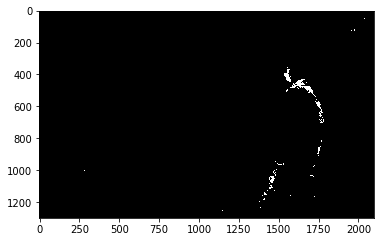

In [97]:
def read_marginal_map(current_frame,threshold):
    marginal_map = np.loadtxt('D:/dataset/workspace/marginal_map/'+ str(current_frame) + 'marginal_map.txt',delimiter=',')
    print('marginal map: ',current_frame)
    print('marginal map max = ',marginal_map.max())
    print('marginal map min = ',marginal_map.min())
    print('marginal map mean = ',marginal_map.mean())
    print('marginal map median = ',np.median(marginal_map))
    
    defect_map = np.zeros((1300,2100),dtype=np.int)
    mask_img = np.zeros((1300,2100),dtype=np.int)
    for i in range(0,1300):
        if (i%10 == 0):
            print('%d'%(i) , end='\r')
        for j in range(0,2100):
            defect_map[i][j] = likelihood_threshold(marginal_map[i][j],threshold)
            mask_img[i][j] = one_to_255(defect_map[i][j])
    plt.imshow(mask_img,cmap='gray')
    
    name = str(current_frame) + 'output_defect_map.png'
    print('Creating: ',name)
    save_path = 'D:/dataset/workspace/output_defect_map/'
    cv2.imwrite(os.path.join(save_path, name), mask_img)
    
    save_path = "D:/dataset/workspace/bin_defect_map/"
    #save marginal map
    np.savetxt(save_path + str(current_frame) + "bin_defect_map.txt", defect_map ,fmt='%f',delimiter=',')
    print('Creating: ',save_path + str(current_frame) + "bin_defect_map.txt")
    
    return defect_map, mask_img

thre = 0.25
read_marginal_map(952218,thre)
read_marginal_map(952219,thre)
read_marginal_map(952220,thre)
read_marginal_map(952221,thre)

### 3.4 Compare the output to ground truth(accuracy check and mark red)

Creating:  true_defect_map.952220.jpg
num_artifact =  162
num_correct =  89
num_loss =  73
num_false_alarm =  12808
accuracy =  55%
Creating:  952220mark.png


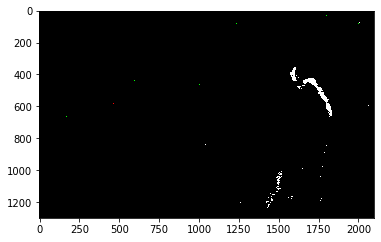

In [88]:
def mark(output, truth):
    img = np.zeros((1300,2100,3),dtype=np.int)
    num_artifact = 0
    num_correct = 0
    num_loss = 0
    num_false_alarm = 0
    for i in range(0,1300):
        for j in range(0,2100):
            if(truth[i][j]==255):
                num_artifact = num_artifact + 1
                if(output[i][j]==255):
                    img[i][j][1] = 255
                    num_correct = num_correct + 1
                else:
                    img[i][j][0] = 255
                    num_loss = num_loss + 1
            elif(output[i][j]==255):
                img[i][j][0] = 255
                img[i][j][1] = 255
                img[i][j][2] = 255
                num_false_alarm = num_false_alarm + 1
    plt.imshow(img)
    print('num_artifact = ',num_artifact)
    print('num_correct = ',num_correct)
    print('num_loss = ',num_loss)
    print('num_false_alarm = ',num_false_alarm)
    print('accuracy = ',"{:.0%}".format(float(num_correct)/float(num_artifact)))
    return img

def accuracy_check(current_frame):    
    name = str(current_frame) + 'output_defect_map.png'
    save_path = 'D:/dataset/workspace/output_defect_map/'
    img_output = cv2.imread(os.path.join(save_path, name),0)

    name = 'true_defect_map.'+ str(current_frame) + '.jpg'
    print('Creating: ',name)
    save_path = 'D:/dataset/true_defect_map'
    img_truth = cv2.imread(os.path.join(save_path, name),0)
    
    img_mark = mark(img_output,img_truth) 
    
    name = str(current_frame) + 'mark.png'
    print('Creating: ',name)
    save_path = 'D:/dataset/workspace/mark/'
    cv2.imwrite(os.path.join(save_path, name), img_mark)
accuracy_check(952220)


### 3.5 Integrate the characteristic check in one function

In [89]:
def check_char(current_frame):
    #Extract image
    plt.figure(figsize=(50,50))
    path_to_save = 'D:\珩珩工作室\polyu study\EIE4433\dataset\GreenStain_Dirts_Flicker_Original'
    data = np.zeros((13,1300,2100))
    name = 'Original.00' + str(current_frame) + '.dpx'
    f = open(os.path.join(path_to_save, name), "rb")
    meta = readDPXMetaData(f)
    img = readDPXImageData(f, meta)
    # https://www.cnblogs.com/denny402/p/5122328.html
    from skimage import img_as_ubyte
    dst=img_as_ubyte(img)
    img_ori = cv2.cvtColor(dst,cv2.COLOR_RGB2GRAY)
    
    print('frame: ', current_frame)
    print('mean of ', current_frame, '= ',img_ori.mean())
    print('var of ', current_frame, '= ',img_ori.var())
    print('std of ', current_frame, '= ',img_ori.std())

check_char(952218)

frame:  952218
mean of  952218 =  67.54738864468864
var of  952218 =  2830.660307429906
std of  952218 =  53.20395011115158


<Figure size 3600x3600 with 0 Axes>

### 3.6 Compare the characteristic and threshold performance

marginal map:  952218
marginal map max =  0.896179
marginal map min =  5e-06
marginal map mean =  0.0475848336923077
marginal map median =  0.031863
Creating:  952218output_defect_map.png
Creating:  D:/dataset/workspace/bin_defect_map/2020-10-03-00-40-40-952218marginal_map.txt
Creating:  true_defect_map.952218.jpg
num_artifact =  207
num_correct =  137
num_loss =  70
num_false_alarm =  5835
accuracy =  66%
Creating:  952218mark.png
frame:  952218
mean of  952218 =  67.54738864468864
var of  952218 =  2830.660307429906
std of  952218 =  53.20395011115158
marginal map:  952219
marginal map max =  0.896179
marginal map min =  0.000154
marginal map mean =  0.048310094310622664
marginal map median =  0.033442
Creating:  952219output_defect_map.png
Creating:  D:/dataset/workspace/bin_defect_map/2020-10-03-00-40-40-952219marginal_map.txt
Creating:  true_defect_map.952219.jpg
num_artifact =  140
num_correct =  105
num_loss =  35
num_false_alarm =  9236
accuracy =  75%
Creating:  952219mark.png

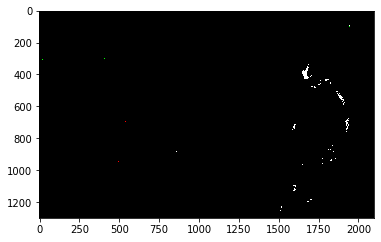

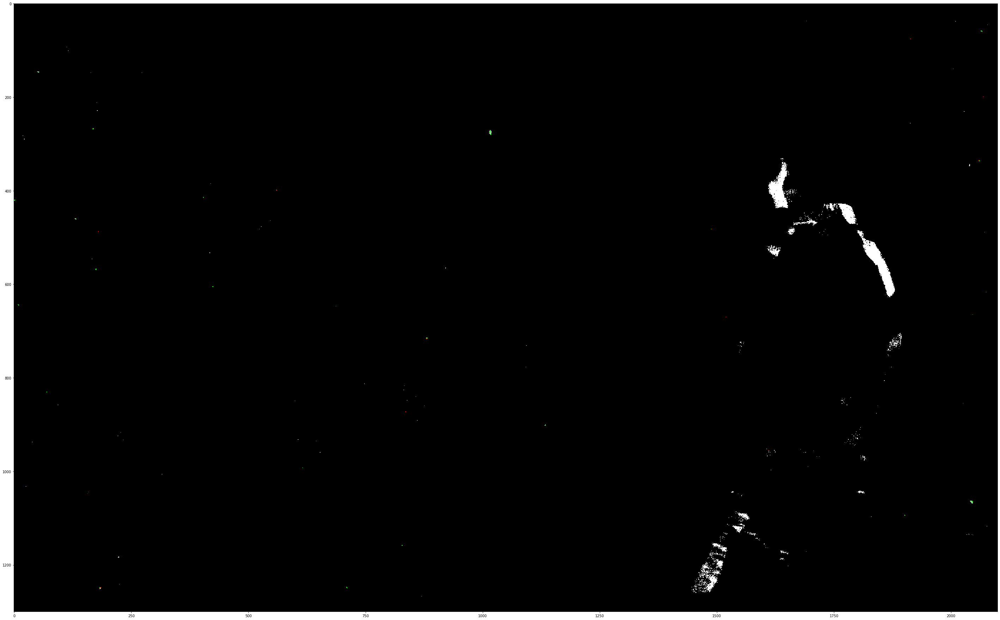

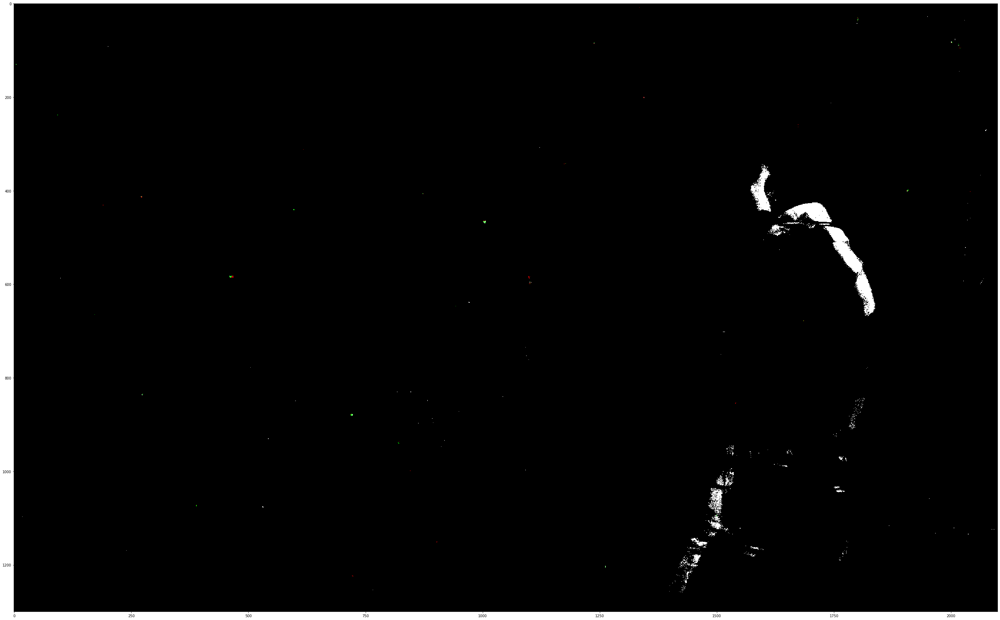

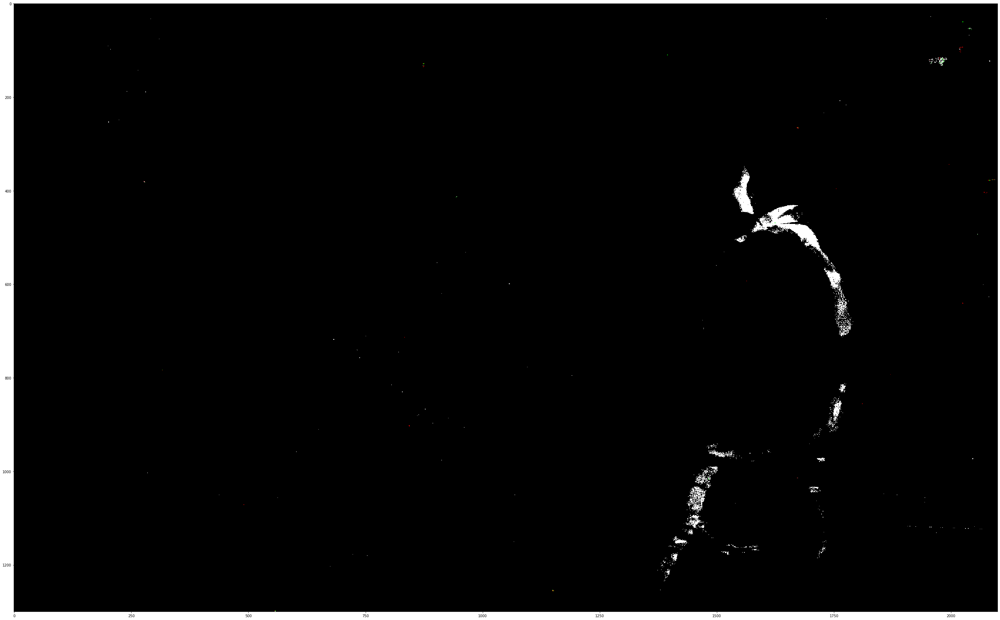

<Figure size 3600x3600 with 0 Axes>

In [90]:
def thre_char_relationship(current_frame,thre):
    print('='*20)
    read_marginal_map(current_frame,thre)
    accuracy_check(current_frame)
    check_char(current_frame)

thre_char_relationship(952218,0.25)    
thre_char_relationship(952219,0.25)
thre_char_relationship(952220,0.25)
thre_char_relationship(952221,0.25)

## 4 MAP calculation and false alarm elimination

### 4.1 MAP of a pixel

In [110]:
import math

def delta(a):
    if(a==0):
        return 1
    else:
        return 0

def pixel_MAP(current_frame):
    a=1
    b1=1
    b2=1
    img_map = 0
    cur_marginal_map = np.loadtxt('D:/dataset/workspace/marginal_map/'+ str(current_frame) + 'marginal_map.txt',delimiter=',')
    prev_marginal_map = np.loadtxt('D:/dataset/workspace/marginal_map/'+ str(current_frame-1) + 'marginal_map.txt',delimiter=',')
    cur_defect_map = np.loadtxt("D:/dataset/workspace/bin_defect_map/" + str(current_frame) + "bin_defect_map.txt", delimiter=',')
    prev_defect_map = np.loadtxt("D:/dataset/workspace/bin_defect_map/" + str(current_frame-1) + "bin_defect_map.txt",delimiter=',')
    for i in range(0+1,1300-1):
        if(i%10 == 0):
            print('process = ',"{:.0%}".format(float(i)/float(1300)),'img_map = ',img_map,end='\r')
        for j in range(0+1,2100-1):
            first_term = a*(1-cur_defect_map[i][j])*((cur_marginal_map[i][j]-prev_marginal_map[i][j])**2)
            second_term = 0
            for x,y in {(1,1),(1,0),(1,-1),(0,1),(0,-1),(-1,1),(-1,0),(-1,-1)}:
                second_term  = second_term + b1*delta(cur_defect_map[i][j]-cur_defect_map[x][y])
            third_term = b2*delta(1-cur_defect_map[i][j])
            pixel_map_sum = math.exp(-first_term-second_term+third_term)
            img_map = img_map + pixel_map_sum
    
def false_alarm_elimination(current_frame):
    a=1
    b1=1
    b2=1
    img_map = 0
    cur_marginal_map = np.loadtxt('D:/dataset/workspace/marginal_map/'+ str(current_frame) + 'marginal_map.txt',delimiter=',')
    prev_marginal_map = np.loadtxt('D:/dataset/workspace/marginal_map/'+ str(current_frame-1) + 'marginal_map.txt',delimiter=',')
    cur_defect_map = np.loadtxt("D:/dataset/workspace/bin_defect_map/" + str(current_frame) + "bin_defect_map.txt", delimiter=',')
    prev_defect_map = np.loadtxt("D:/dataset/workspace/bin_defect_map/" + str(current_frame-1) + "bin_defect_map.txt",delimiter=',')
    for gi in range(0+1,1300-1):
        if(i%10 == 0):
            print('process = ',"{:.0%}".format(float(gi)/float(1300)),end='\r')
        for gj in range(0+1,2100-1):
            
            if(cur_defect_map[i][j]==1):
                img_map = 0
                img_map_update = 0
                #Origin
                for i in range(0+1,1300-1):
                    if(i%10 == 0):
                        print('position = ',x,':',y,'process = ',"{:.0%}".format(float(i)/float(1300)),'img_map = ',img_map,end='\r')
                    for j in range(0+1,2100-1):
                        first_term = a*(1-cur_defect_map[i][j])*((cur_marginal_map[i][j]-prev_marginal_map[i][j])**2)
                        second_term = 0
                        for x,y in {(1,1),(1,0),(1,-1),(0,1),(0,-1),(-1,1),(-1,0),(-1,-1)}:
                            second_term  = second_term + b1*delta(cur_defect_map[i][j]-cur_defect_map[x][y])
                        third_term = b2*delta(1-cur_defect_map[i][j])
                        pixel_map_sum = math.exp(-first_term-second_term+third_term)
                        img_map = img_map + pixel_map_sum
                #Eliminate the point  
                cur_defect_map_update = cur_defect_map.copy()
                cur_defect_map_update[gi][gj] = 0
                for i in range(0+1,1300-1):
                    if(i%10 == 0):
                        print('position = ',x,':',y,'process = ',"{:.0%}".format(float(i)/float(1300)),'img_map = ',img_map,end='\r')
                    for j in range(0+1,2100-1):
                        first_term = a*(1-cur_defect_map_update[i][j])*((cur_marginal_map[i][j]-prev_marginal_map[i][j])**2)
                        second_term = 0
                        for x,y in {(1,1),(1,0),(1,-1),(0,1),(0,-1),(-1,1),(-1,0),(-1,-1)}:
                            second_term  = second_term + b1*delta(cur_defect_map_update[i][j]-cur_defect_map_update[x][y])
                        third_term = b2*delta(1-cur_defect_map_update[i][j])
                        pixel_map_sum = math.exp(-first_term-second_term+third_term)
                        img_map_update = img_map + pixel_map_sum
                print('img_map=',img_map)
                print('img_map_update=',img_map_update)
pixel_MAP(952219)

In [109]:
# Three tasks: 1. Equalization 2. MAP 3. compare differentsituation

In [ ]:
# 5 Try to perform equalization  